In [26]:
from __future__ import print_function

import numpy as np

import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import json
import os
import mne
import copy

import ecogtools

In [27]:
%matplotlib inline

# Set-Up 

In [46]:
patient_num = "2002"

channels = ['RTG22', 'RTG23', 'RTG24', 'RTG30', 'RTG31', 'RTG32', 'RTG38', 'RTG39', 'RTG40', 'RTG46', 'RTG47', 'RTG48', 'RTG57']

In [47]:
data = ecogtools.ToM_2010(patient_num)

Opening raw data file /Users/atheliarosapaulli/Desktop/pearson lab/Ecog_data_analysis/patient_2002/john_2002.fif...
This filename (/Users/atheliarosapaulli/Desktop/pearson lab/Ecog_data_analysis/patient_2002/john_2002.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz


/Users/atheliarosapaulli/Desktop/pearson lab/ecogtools/ecogtools.py:34: RuntimeWarning: This filename (/Users/atheliarosapaulli/Desktop/pearson lab/Ecog_data_analysis/patient_2002/john_2002.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  self.phys = mne.io.read_raw_fif(self.ecogfile, preload=False)


Isotrak not found
    Range : 0 ... 4157999 =      0.000 ...  2078.999 secs
Ready.
Opening raw data file /Users/atheliarosapaulli/Desktop/pearson lab/Ecog_data_analysis/patient_2002/john_2002-1.fif...
Isotrak not found
    Range : 4158000 ... 8315999 =   2079.000 ...  4157.999 secs
Ready.
Opening raw data file /Users/atheliarosapaulli/Desktop/pearson lab/Ecog_data_analysis/patient_2002/john_2002-2.fif...
Isotrak not found
    Range : 8316000 ... 12473999 =   4158.000 ...  6236.999 secs
Ready.
Opening raw data file /Users/atheliarosapaulli/Desktop/pearson lab/Ecog_data_analysis/patient_2002/john_2002-3.fif...
Isotrak not found
    Range : 12474000 ... 14399951 =   6237.000 ...  7199.975 secs
Ready.


In [48]:
# Get the times for task from behavioral data
tmin = int(data.trig_and_behav.loc[0, 'trigger_time']-10)
tmax = int(data.trig_and_behav.loc[59, 'trigger_time']+10)

# Get only physiology data that we actually want to look at for task.
data.phys.crop(tmin=tmin, tmax=tmax)

<Raw  |  john_2002-1.fif, n_channels x n_times : 129 x 712001 (356.0 sec), ~222 kB, data not loaded>

In [49]:
# Load data and pick only channels that we care about.
data.phys.load_data()
data.phys.pick_channels(channels)

Reading 0 ... 712000  =      0.000 ...   356.000 secs...


<Raw  |  john_2002-1.fif, n_channels x n_times : 13 x 712001 (356.0 sec), ~70.6 MB, data loaded>

In [50]:
# Create epochs object for trial viz and averaging.
data.initialize_epochs_object(channels, tmin=-6., tmax=6., baseline=None)

81 matching events found
0 projection items activated
Loading data for 81 events and 24001 original time points ...
20 bad epochs dropped


In [51]:
# Create evoked for Question Start mental/physical
mental_qs_evoked = data.create_evoked("mental/quest_start")
physical_qs_evoked = data.create_evoked("physical/quest_start")
QS_evoked_MP = mne.combine_evoked([mental_qs_evoked, physical_qs_evoked], weights=[1, -1])

# Create evoked for Question Start expected/unexpected
expected_qs_evoked = data.create_evoked("expected/quest_start")
unexpected_qs_evoked = data.create_evoked("unexpected/quest_start")
QS_evoked_EU = mne.combine_evoked([expected_qs_evoked, unexpected_qs_evoked], weights=[1, -1])


In [52]:
# Create evoked for Time of Response mental/physical
mental_tr_evoked = data.create_evoked("mental/time_of_response")
physical_tr_evoked = data.create_evoked("physical/time_of_response")
TR_evoked_MP = mne.combine_evoked([mental_tr_evoked, physical_tr_evoked], weights=[1, -1])

# Create evoked for Time of Response expected/unexpected
expected_tr_evoked = data.create_evoked("expected/time_of_response")
unexpected_tr_evoked = data.create_evoked("unexpected/time_of_response")
TR_evoked_EU = mne.combine_evoked([expected_tr_evoked, unexpected_tr_evoked], weights=[1, -1])


In [53]:
# Define frequencies, cycles and bandwidth
freqs = np.linspace(80, 150, 25)
n_cycles = freqs/2.0
time_bandwidth = 8.0

In [54]:
# Calculate power for Question Start for mental/physical
mental_qs_power = mne.time_frequency.tfr_multitaper(data.epochs['mental/quest_start'], freqs=freqs, n_cycles=n_cycles,
                       time_bandwidth=time_bandwidth, return_itc=False)
physical_qs_power = mne.time_frequency.tfr_multitaper(data.epochs['physical/quest_start'], freqs=freqs, n_cycles=n_cycles,
                       time_bandwidth=time_bandwidth, return_itc=False)
QS_power_MP = data.compute_diff_power(mental_qs_power, physical_qs_power)

# Calculate power for Question Start for expected/unexpected
expected_qs_power = mne.time_frequency.tfr_multitaper(data.epochs['expected/quest_start'], freqs=freqs, n_cycles=n_cycles,
                       time_bandwidth=time_bandwidth, return_itc=False)
unexpected_qs_power = mne.time_frequency.tfr_multitaper(data.epochs['unexpected/quest_start'], freqs=freqs, n_cycles=n_cycles,
                       time_bandwidth=time_bandwidth, return_itc=False)
QS_power_EU = data.compute_diff_power(expected_qs_power, unexpected_qs_power)



In [55]:
# Calculate power for Time of Response for mental/physical
mental_tr_power = mne.time_frequency.tfr_multitaper(data.epochs['mental/time_of_response'], freqs=freqs, n_cycles=n_cycles,
                       time_bandwidth=time_bandwidth, return_itc=False)
physical_tr_power = mne.time_frequency.tfr_multitaper(data.epochs['physical/time_of_response'], freqs=freqs, n_cycles=n_cycles,
                       time_bandwidth=time_bandwidth, return_itc=False)
TR_power_MP = data.compute_diff_power(mental_tr_power, physical_tr_power)

# Calculate power for Time of Response for expected/unexpected
expected_tr_power = mne.time_frequency.tfr_multitaper(data.epochs['expected/time_of_response'], freqs=freqs, n_cycles=n_cycles,
                       time_bandwidth=time_bandwidth, return_itc=False)
unexpected_tr_power = mne.time_frequency.tfr_multitaper(data.epochs['unexpected/time_of_response'], freqs=freqs, n_cycles=n_cycles,
                       time_bandwidth=time_bandwidth, return_itc=False)
TR_power_EU = data.compute_diff_power(expected_tr_power, unexpected_tr_power)



In [56]:
# Copy data class for Filter-Hilbert Transform
data_filt = copy.copy(data)
data_filt.phys.filter(80, 160)
data_filt.phys.apply_hilbert(envelope=True)

Setting up band-pass filter from 80 - 1.6e+02 Hz
l_trans_bandwidth chosen to be 20.0 Hz
h_trans_bandwidth chosen to be 40.0 Hz
Filter length of 660 samples (0.330 sec) selected


<Raw  |  john_2002-1.fif, n_channels x n_times : 13 x 712001 (356.0 sec), ~70.6 MB, data loaded>

In [57]:
# New epochs object for filtered/HT data
data_filt.initialize_epochs_object(channels, tmin=-6., tmax=6., baseline=None)

81 matching events found
0 projection items activated
Loading data for 81 events and 24001 original time points ...
20 bad epochs dropped


In [58]:
# Evoked Power for Question Start mental/physical
mental_qs_filt = data_filt.create_evoked("mental/quest_start")
physical_qs_filt = data_filt.create_evoked("physical/quest_start")
QS_filt_MP = mne.combine_evoked([mental_qs_filt, physical_qs_filt], weights = [1, -1])

# Evoked Power for Question Start expected/unexpected
expected_qs_filt = data_filt.create_evoked("expected/quest_start")
unexpected_qs_filt = data_filt.create_evoked("unexpected/quest_start")
QS_filt_EU = mne.combine_evoked([expected_qs_filt, unexpected_qs_filt], weights = [1, -1])


In [59]:
# Evoked Power for Time of Response mental/physical
mental_tr_filt = data_filt.create_evoked("mental/time_of_response")
physical_tr_filt = data_filt.create_evoked("physical/time_of_response")
TR_filt_MP = mne.combine_evoked([mental_tr_filt, physical_tr_filt], weights = [1, -1])

# Evoked Power for Time of Response expected/unexpected
expected_tr_filt = data_filt.create_evoked("expected/time_of_response")
unexpected_tr_filt = data_filt.create_evoked("unexpected/time_of_response")
TR_filt_EU = mne.combine_evoked([expected_tr_filt, unexpected_tr_filt], weights = [1, -1])


# Plotting

In [61]:
# Choose channels and define parameters for all functions
channel_of_interest = "RTG31"
index = channels.index(channel_of_interest)
COI = [index]

# Times and baseline periods for QS/TR
QS_times = {"tmin":-1., "tmax":6.}
TR_times = {"tmin":-6., "tmax":1.}
QS_baseline = (-1., 0)
TR_baseline = (0., .5)

## Loop through plots

Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying ba

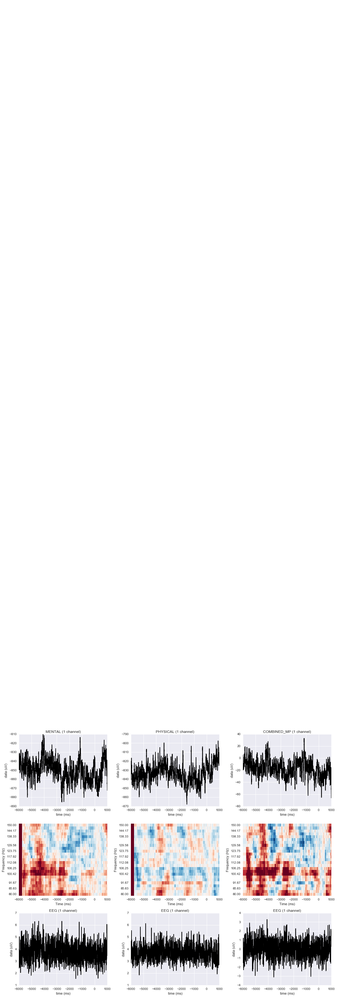

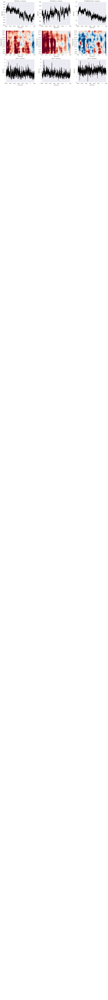

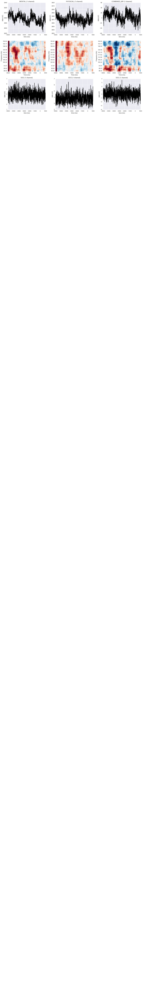

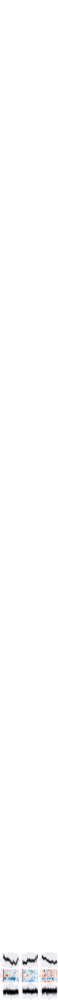

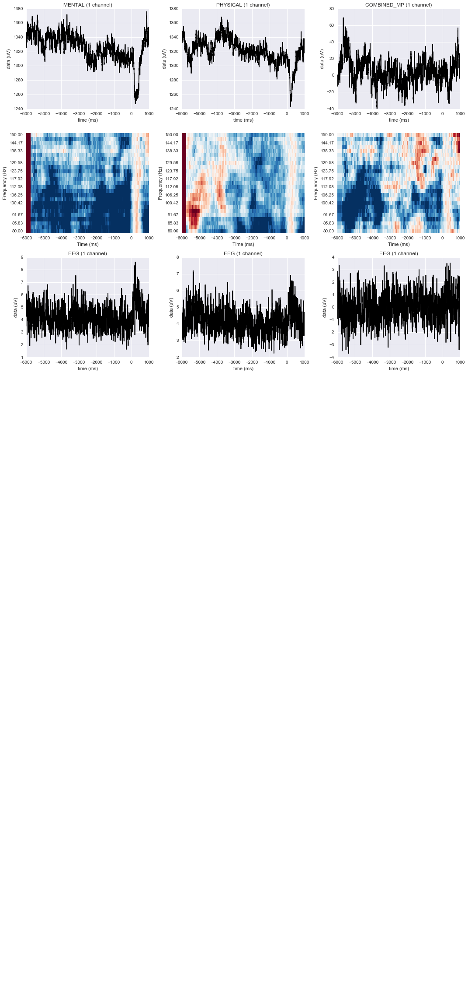

...

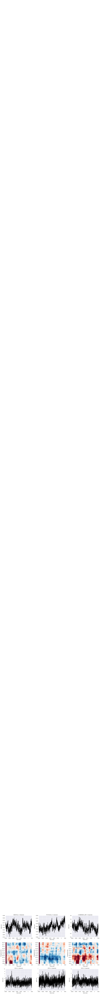

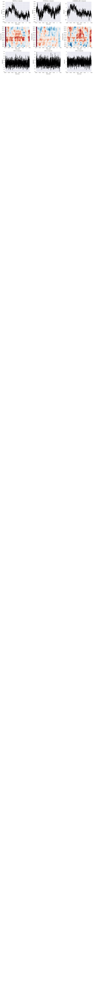

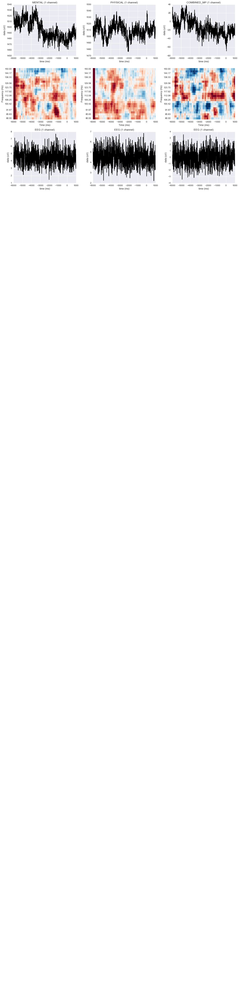

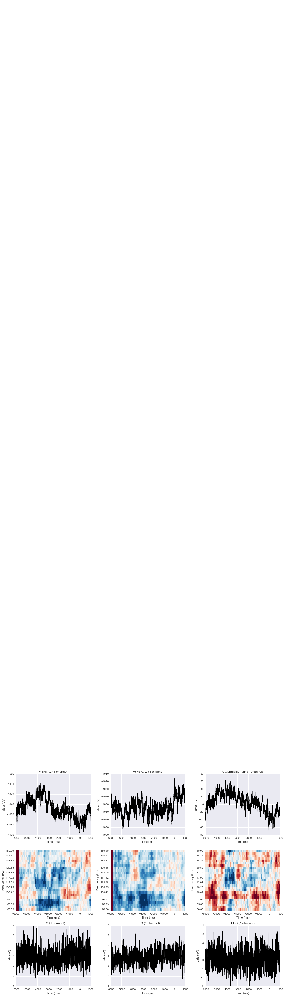

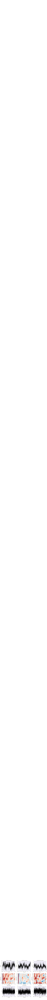

In [29]:
# Times and baseline periods for TR mental/physical
TR_times = {"tmin":-6., "tmax":1.}
TRTR_baseline = (0., 1.)

for channel in channels:
    channel_of_interest = channel
    index = channels.index(channel_of_interest)
    COI = [index]
    
    f, axes = plt.subplots(3, 3, figsize=(15,12))

    mental_tr_evoked.crop(**TR_times).plot(COI, axes=axes[0,0], show=False, titles="MENTAL");
    physical_tr_evoked.crop(**TR_times).plot(COI, axes=axes[0, 1], show=False, titles="PHYSICAL");
    TR_evoked_MP.crop(**TR_times).plot(COI, axes=axes[0, 2], show=False, titles="COMBINED_MP");
    
    mental_tr_power.plot(COI, baseline=TR_baseline, mode='ratio', dB=True, vmin=-5., vmax=5., **TR_times, axes=axes[1, 0], show=False, colorbar=False);
    physical_tr_power.plot(COI, baseline=TR_baseline, mode='ratio', dB=True, vmin=-5., vmax=5., **TR_times, axes=axes[1, 1], show=False, colorbar=False);
    TR_power_MP.plot(COI, baseline=TR_baseline, mode='ratio', dB=True, vmin=-5., vmax=5., **TR_times, axes=axes[1, 2], show=False, colorbar=False);

    mental_tr_filt.crop(**TR_times).plot(COI, axes=axes[2, 0], show=False);
    physical_tr_filt.crop(**TR_times).plot(COI, axes=axes[2, 1], show=False);
    TR_filt_MP.crop(**TR_times).plot(COI, axes=axes[2, 2], show=False);

    f.savefig("patient_"+patient_num+'/ToM_2010_TR_MP_plots/' + channel_of_interest + ".png")




Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying ba

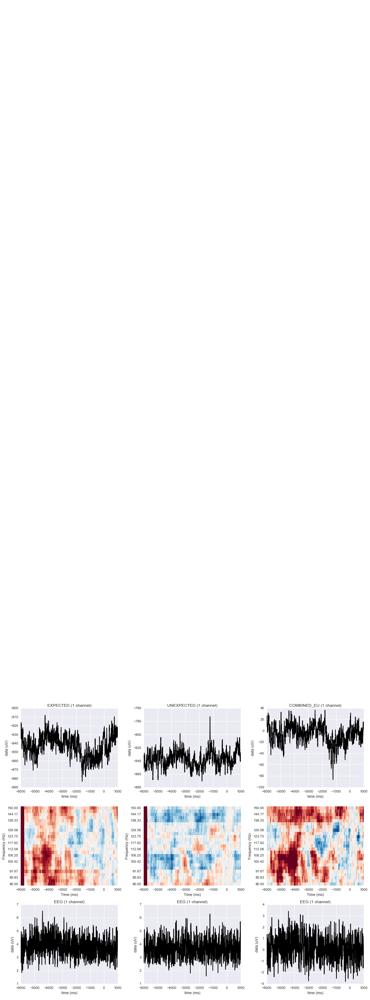

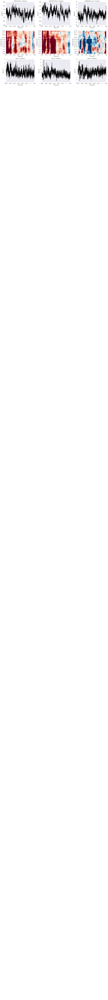

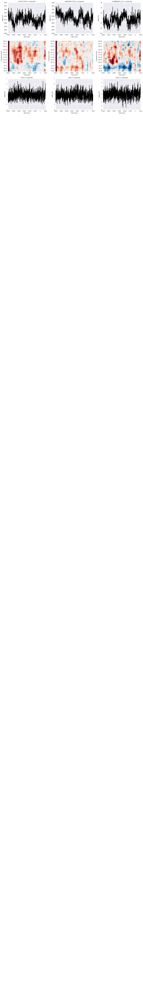

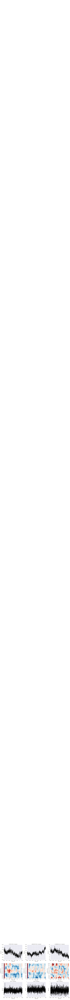

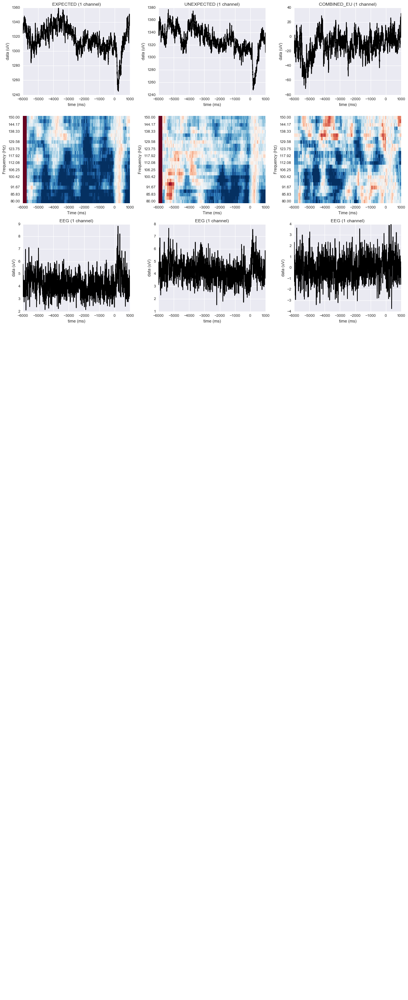

...

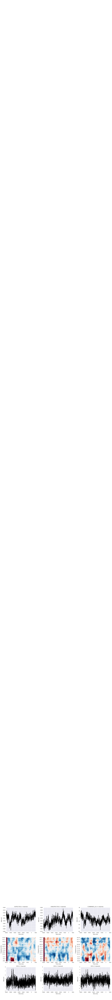

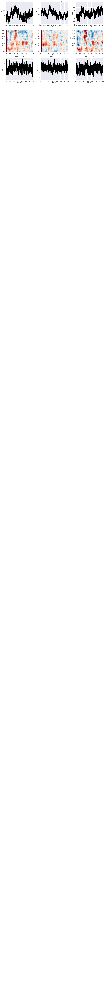

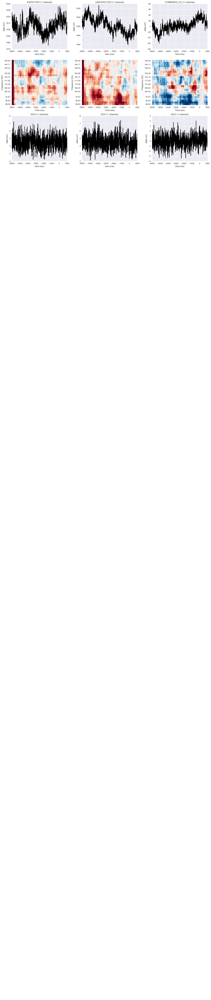

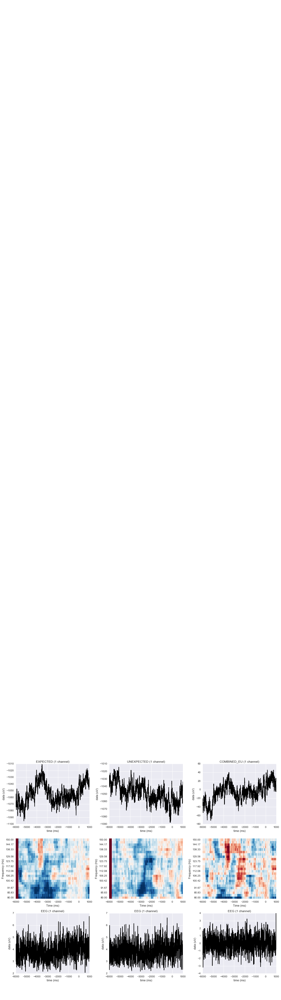

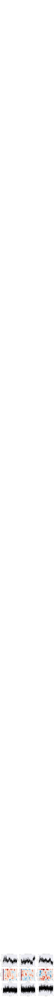

In [30]:
# Times and baseline periods for TR expected/unexpected
TR_times = {"tmin":-6., "tmax":1.}
TRTR_baseline = (0., 1.)

for channel in channels:
    channel_of_interest = channel
    index = channels.index(channel_of_interest)
    COI = [index]
    
    f, axes = plt.subplots(3, 3, figsize=(15,12))

    expected_tr_evoked.crop(**TR_times).plot(COI, axes=axes[0,0], show=False, titles="EXPECTED");
    unexpected_tr_evoked.crop(**TR_times).plot(COI, axes=axes[0, 1], show=False, titles="UNEXPECTED");
    TR_evoked_EU.crop(**TR_times).plot(COI, axes=axes[0, 2], show=False, titles="COMBINED_EU");
    
    expected_tr_power.plot(COI, baseline=TR_baseline, mode='ratio', dB=True, vmin=-5., vmax=5., **TR_times, axes=axes[1, 0], show=False, colorbar=False);
    unexpected_tr_power.plot(COI, baseline=TR_baseline, mode='ratio', dB=True, vmin=-5., vmax=5., **TR_times, axes=axes[1, 1], show=False, colorbar=False);
    TR_power_EU.plot(COI, baseline=TR_baseline, mode='ratio', dB=True, vmin=-5., vmax=5., **TR_times, axes=axes[1, 2], show=False, colorbar=False);

    expected_tr_filt.crop(**TR_times).plot(COI, axes=axes[2, 0], show=False);
    unexpected_tr_filt.crop(**TR_times).plot(COI, axes=axes[2, 1], show=False);
    TR_filt_EU.crop(**TR_times).plot(COI, axes=axes[2, 2], show=False);

    f.savefig("patient_"+patient_num+'/ToM_2010_TR_EU_plots/' + channel_of_interest + ".png")

Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)
Applying ba

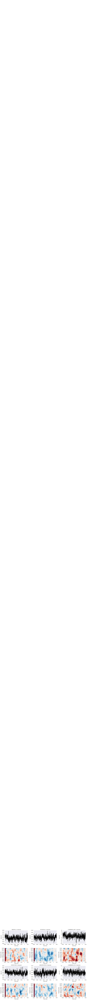

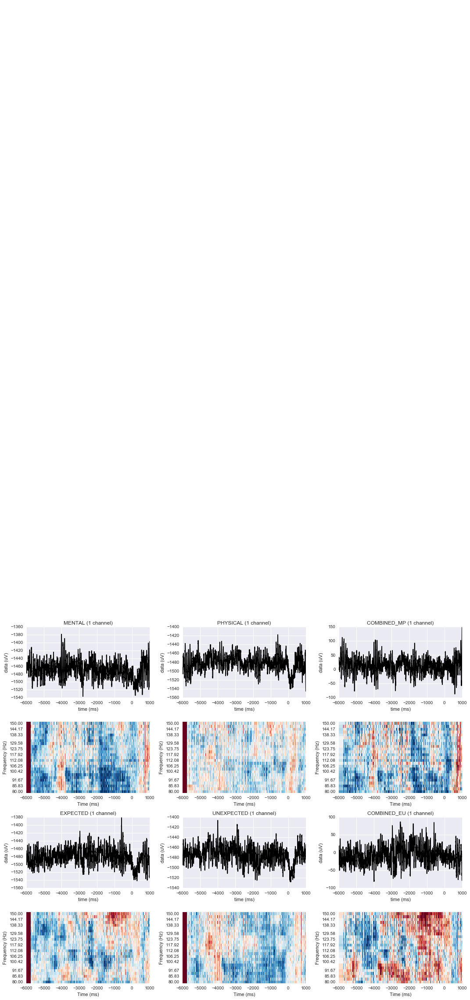

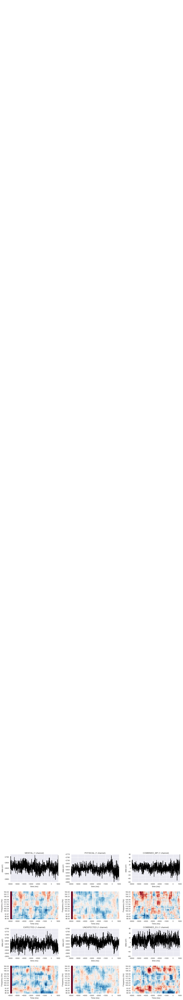

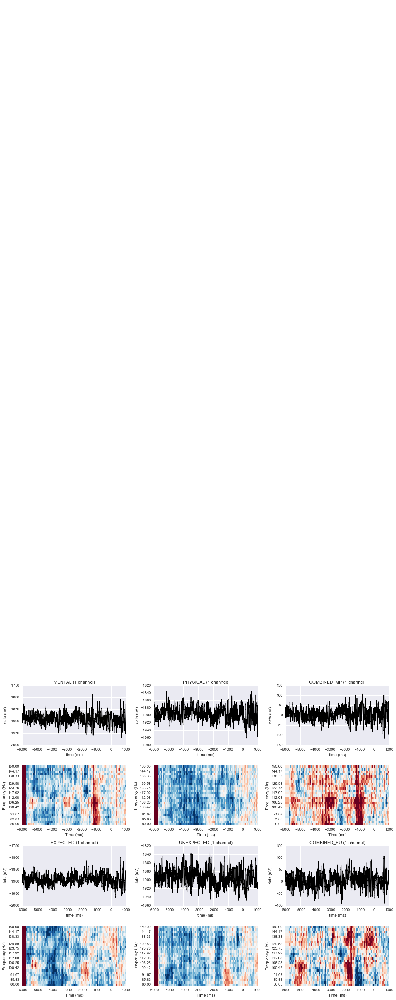

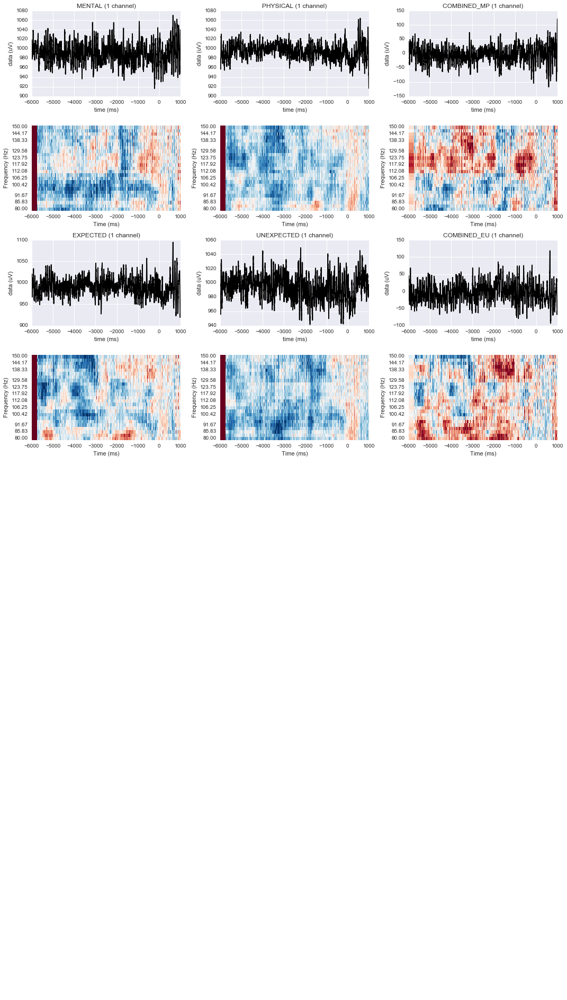

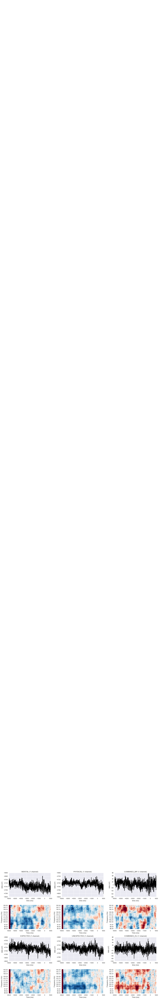

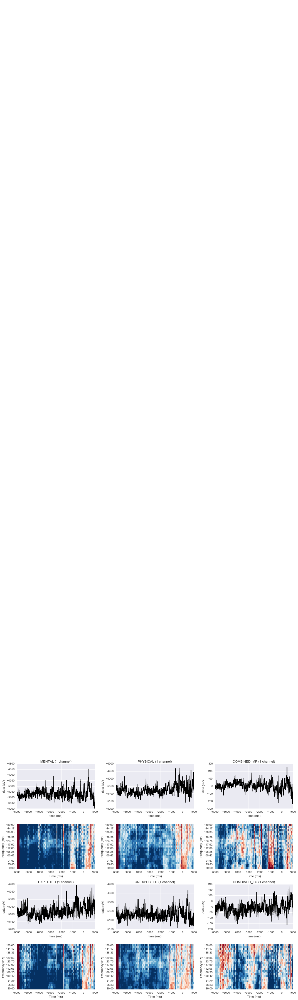

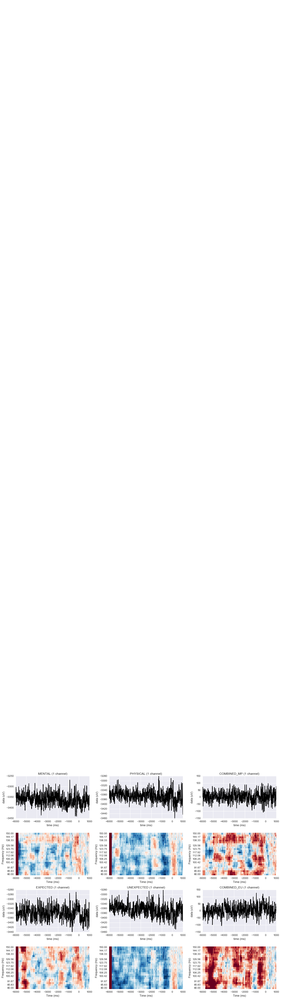

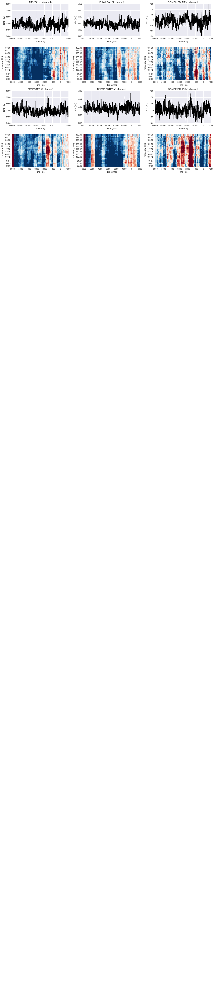

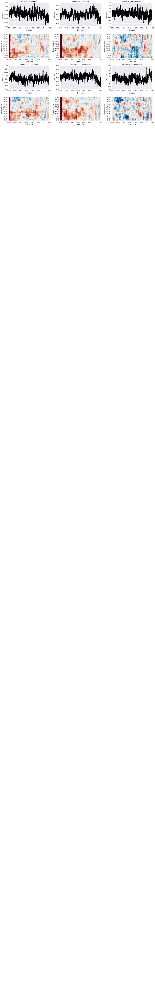

In [46]:
#different organization of same plots 
# Times and baseline periods for TR 
TR_times = {"tmin":-6., "tmax":1.}
TR_baseline = (0., 1.)

for channel in channels:
    channel_of_interest = channel
    index = channels.index(channel_of_interest)
    COI = [index]
    
    f, axes = plt.subplots(4, 3, figsize=(15,12))
    
    mental_tr_evoked.crop(**TR_times).plot(COI, axes=axes[0,0], show=False, titles="MENTAL");
    physical_tr_evoked.crop(**TR_times).plot(COI, axes=axes[0, 1], show=False, titles="PHYSICAL");
    TR_evoked_MP.crop(**TR_times).plot(COI, axes=axes[0, 2], show=False, titles="COMBINED_MP");
    
    mental_tr_power.plot(COI, baseline=TR_baseline, mode='ratio', dB=True, vmin=-5., vmax=5., **TR_times, axes=axes[1, 0], show=False, colorbar=False);
    physical_tr_power.plot(COI, baseline=TR_baseline, mode='ratio', dB=True, vmin=-5., vmax=5., **TR_times, axes=axes[1, 1], show=False, colorbar=False);
    TR_power_MP.plot(COI, baseline=TR_baseline, mode='ratio', dB=True, vmin=-5., vmax=5., **TR_times, axes=axes[1, 2], show=False, colorbar=False);
    
    expected_tr_evoked.crop(**TR_times).plot(COI, axes=axes[2,0], show=False, titles="EXPECTED");
    unexpected_tr_evoked.crop(**TR_times).plot(COI, axes=axes[2, 1], show=False, titles="UNEXPECTED");
    TR_evoked_EU.crop(**TR_times).plot(COI, axes=axes[2, 2], show=False, titles="COMBINED_EU");
    
    expected_tr_power.plot(COI, baseline=TR_baseline, mode='ratio', dB=True, vmin=-5., vmax=5., **TR_times, axes=axes[3, 0], show=False, colorbar=False);
    unexpected_tr_power.plot(COI, baseline=TR_baseline, mode='ratio', dB=True, vmin=-5., vmax=5., **TR_times, axes=axes[3, 1], show=False, colorbar=False);
    TR_power_EU.plot(COI, baseline=TR_baseline, mode='ratio', dB=True, vmin=-5., vmax=5., **TR_times, axes=axes[3, 2], show=False, colorbar=False);
    
    f.savefig("patient_"+patient_num+'/ToM_2010_TR_combo_plots/' + channel_of_interest + ".png")

Applying baseline correction (mode: ratio)


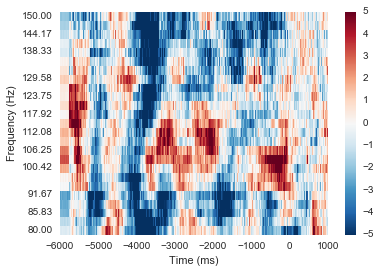

Applying baseline correction (mode: ratio)


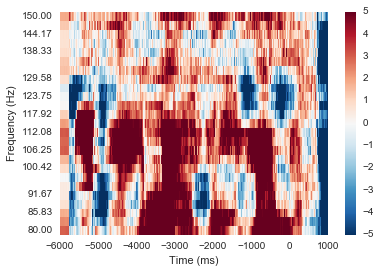

Applying baseline correction (mode: ratio)


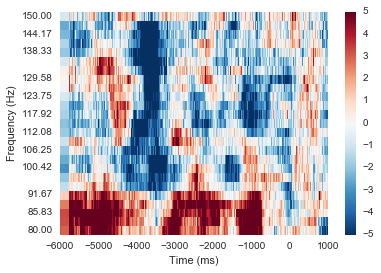

Applying baseline correction (mode: ratio)


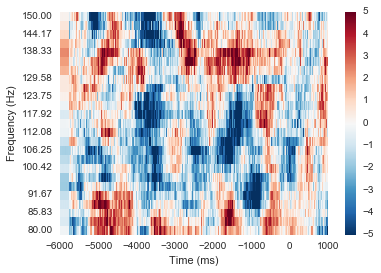

Applying baseline correction (mode: ratio)


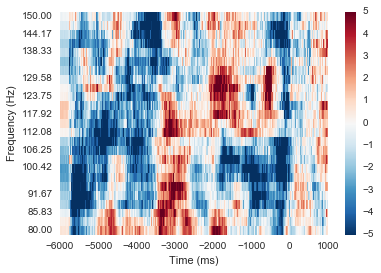

Applying baseline correction (mode: ratio)


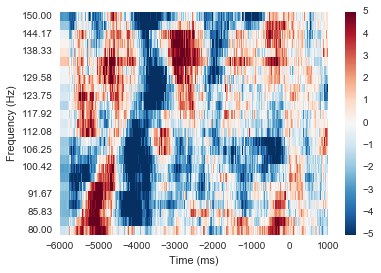

Applying baseline correction (mode: ratio)


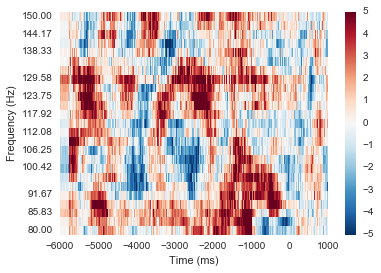

Applying baseline correction (mode: ratio)


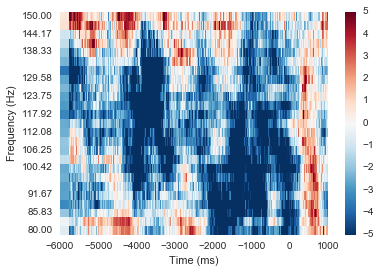

Applying baseline correction (mode: ratio)


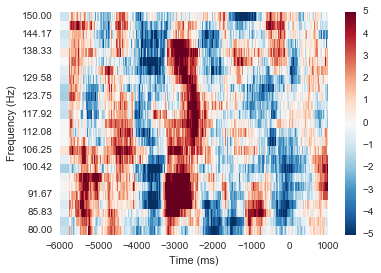

Applying baseline correction (mode: ratio)


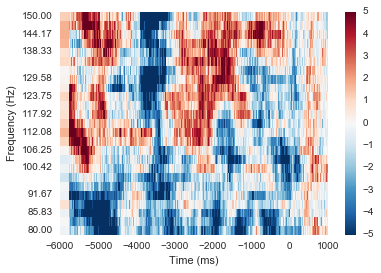

Applying baseline correction (mode: ratio)


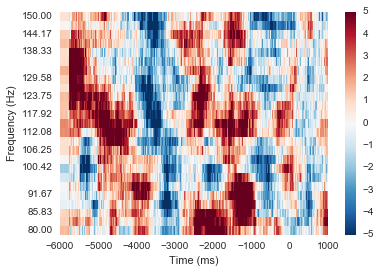

Applying baseline correction (mode: ratio)


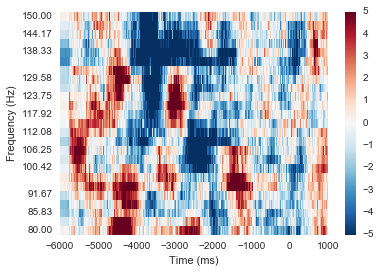

Applying baseline correction (mode: ratio)


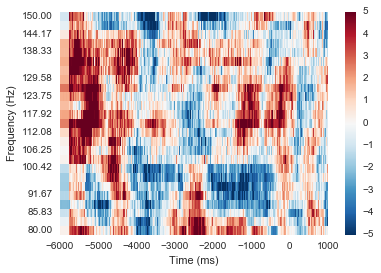

In [62]:
#different organization of same plots 
# Times and baseline periods for TR 
TR_times = {"tmin":-6., "tmax":1.}
TR_baseline = (0., 1.)

for channel in channels:
    channel_of_interest = channel
    index = channels.index(channel_of_interest)
    COI = [index]
        
    TR_combined_power_MP_ratio_EU = data.compute_diff_power(TR_power_MP, TR_power_EU)

    combined = TR_combined_power_MP_ratio_EU.plot(COI, baseline=TR_baseline, mode='ratio', dB=True, vmin=-5., vmax=5., **TR_times, show=True, colorbar=True);

    combined.savefig("patient_"+patient_num+'/ToM_2010_MPcomb-EUcomb_plots/' + channel_of_interest + ".png")